In [21]:
from pathlib import Path
import numpy as np
import datetime
import netCDF4
import xarray as xr
import matplotlib.pyplot as plt
import pyproj
from pyproj import Transformer
from pyproj import CRS
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import hvplot.xarray
import panel as pn
import panel.widgets as pnw
import ipywidgets as ipw

In [22]:
SUM_MONTHS=[1, 2, 3, 10, 11, 12]
def read_file_paths(filename):
    this_dir=Path.cwd()
    data_dir=this_dir.parent/Path("Data")
    files = data_dir.rglob(filename)
    for i in files:
        data = i
    return data

        
def find_racmo_for_insitu_data(dataset,v,in_situ_site):
    data_v= dataset[v]
    time_series = data_v.sel(rlon=in_situ_site[0], rlat=in_situ_site[1], method='nearest')
    return time_series      

def find_anomaly(dataset):
    return dataset - dataset.mean(dim='time')

def resample_summer(data):
    return data.sel(time=data.time.dt.month.isin(SUM_MONTHS))

def resample_data(data,freq):
    d2= data.sortby('time')
    d2=d2.resample(time=freq).mean(skipna=True)
    return resample_summer(d2)
    
def calc_anomaly(data):
    return data-data.mean('time')

def create_attrs(data,sampling_time):
    data.attrs['Conventions']='CF-1.4'
    data.attrs['source']= 'RACMO2'
    data.attrs['Domain']= 'XPEN055'
    data.attrs['Experiment']= 'ERA5-3H_RACMO2.3p2'
    data.attrs['institution']= 'Royal Netherlands Meteorological Institute (KNMI)'
    data.attrs['title']= sampling_time
    return

def write_out_file(data):
    filename=data.attrs['title']+'.nc'
    this_dir=Path.cwd()
    out_path=this_dir.parent/Path("Data/Cleaned and masked NETCDF files"+'/'+filename)
    data.to_netcdf(out_path)

In [23]:
data_crs=CRS('-m 57.295779506 +proj=ob_tran +o_proj=latlon +o_lat_p=-180.0 +lon_0=30.0 +o_lon_p=0')
from_lat_lon_crs = CRS.from_proj4("+proj=latlon")
transproj = Transformer.from_crs(from_lat_lon_crs, data_crs)

#SPRI AWS STATION COORDINATE
AWSlon = -67.69971
AWSlat = -71.14409

#BAS FOSSIL BLUFF AWS STATION COORDINATE
BAS_FB_lon = -68
BAS_FB_lat = -71.329

##SPRI AWS STATION ROTATED
aws_rotated=transproj.transform(AWSlon,AWSlat)
print('AWS rotated = ',aws_rotated)


##BAS FOSSIL BLUFF AWS STATION ROTATED
bas_fb_rotated=transproj.transform(BAS_FB_lon,BAS_FB_lat)
print('BAS Fossil Bluff rotated = ',bas_fb_rotated)

AWS rotated =  (-18.69776623671606, -2.481756537563884)
BAS Fossil Bluff rotated =  (-18.501719991296497, -2.5536000532157934)


In [24]:
melt=xr.open_dataset(read_file_paths('snowmelt.nc'))
wind=xr.open_dataset(read_file_paths('10-m Wind Speed.nc'))
prec=xr.open_dataset(read_file_paths('precipitation.nc'))
rh=xr.open_dataset(read_file_paths('relative_humidity.nc'))
temp=xr.open_dataset(read_file_paths('temp.nc'))
sp=xr.open_dataset(read_file_paths('surface_pressure.nc')) 

all_vars=xr.merge([melt,wind,prec,rh,temp,sp])

In [25]:
all_vars.attrs["title"]="All Variables Combined"

In [6]:
biweekly_data=resample_data(all_vars,'SMS')
daily_data=resample_data(all_vars,'1D')
monthly_data=resample_data(all_vars,'1M')
anomaly_data= calc_anomaly(all_vars)


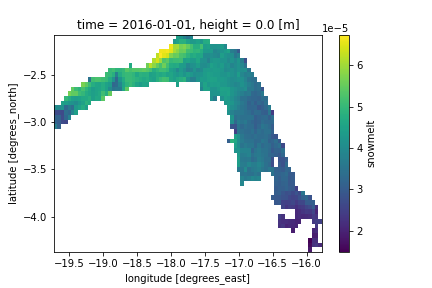

In [7]:
biweekly_data.snowmelt.interactive.sel(time=pnw.DiscreteSlider).plot()


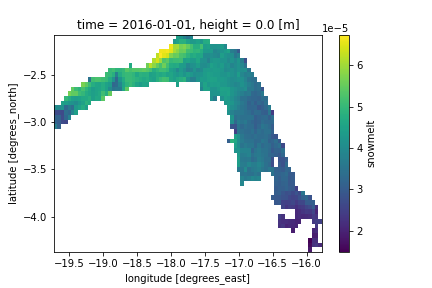

In [8]:
biweekly_data.snowmelt.interactive(loc='bottom').isel(time=pnw.Player(name='time')).plot()

In [9]:
fig = make_subplots(rows=3, cols=2,  shared_xaxes=True )

fig = px.imshow(biweekly_data.precip.squeeze(), animation_frame='time',color_continuous_scale='RdBu_r')
fig.show()

In [10]:
create_attrs(biweekly_data,"Biweekly Data")
create_attrs(monthly_data,"Monthly Data")
create_attrs(daily_data,"Daily Data")
create_attrs(anomaly_data,"Anomaly Data")

In [13]:
write_out_file(biweekly_data)
write_out_file(daily_data)
write_out_file(monthly_data)
write_out_file(anomaly_data)
write_out_file(all_vars)

In [12]:
# temp.t2m.hvplot.scatter('time', groupby=[], datashade=True) *\
# temp.t2m.mean(['rlat', 'rlon']).hvplot.line('time', color='indianred')